<a href="https://colab.research.google.com/github/mmartamagna/Plant-leaves-classification-AMD/blob/main/Final_project_plant_leaves.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Plant leaves recognizer with deep learning
### *Marta Magnani (961071) - Università degli Studi di Milano*

Project for the module **Algoritms for Massive Data** of the course Algoritms for Massive Data, Cloud and Distributed Computing for the academic year 2022-2023. The task is to implement a deep-learning-based system classifying pictures of leaves according to the twelve types of plants using the «Plant leaves» dataset. The «Plant leaves» dataset is published on Kaggle and released under the Community Data License Agreement – Sharing, Version 1.0.

Here the data: https://www.kaggle.com/datasets/csafrit2/plant-leaves-for-image-classification

# Libraries and data download

In [5]:
# Import basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import datetime
import seaborn as sns
import random
from sklearn.model_selection import train_test_split
import pickle
import pathlib

# OpenCV (Open Source Computer Vision Library: http://opencv.org) is an open-source library that includes
# several hundreds of computer vision algorithms for image operations.
import cv2

# tensorflow is the library used for deep learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.python.keras.layers import Dense
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

# visualkeras to get a pretty visualization of neural networks architectures
# https://github.com/ashishpatel26/Tools-to-Design-or-Visualize-Architecture-of-Neural-Network

# PIL for image preprocessing
import PIL
import PIL.Image

# Neural Networks
from keras.utils import to_categorical, load_img, img_to_array
from keras.wrappers.scikit_learn import KerasClassifier
from keras.preprocessing.image import ImageDataGenerator
from keras import models, layers, callbacks, regularizers
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout, Activation
from keras.optimizers import Adam, SGD, RMSprop
from keras.losses import binary_crossentropy

# Cross validation
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, zero_one_loss

tfk = tf.keras
#tf.keras.backend.set_floatx("float64")
%load_ext tensorboard

In [ ]:
# if you want to specify your own uername-key, just change it
os.environ["KAGGLE_USERNAME"] = "martamagnani"
os.environ["KAGGLE_KEY"] = "db892507e7f56ef71bddb9f177b69bc5"

In [ ]:
!kaggle datasets download -d csafrit2/plant-leaves-for-image-classificationb -p "/content/drive/MyDrive/Plant leaves"

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/Plant leaves/dataset-name.zip" -d "/content/drive/MyDrive/Plant leaves"

In [6]:
# Set the folder paths
train_folder = "/content/drive/MyDrive/Plant leaves/Plants_2/train"
validation_folder = "/content/drive/MyDrive/Plant leaves/Plants_2/valid"
test_folder = "/content/drive/MyDrive/Plant leaves/Plants_2/test"

# Function to count files in a folder
def count_files(folder_path):
    file_count = 0
    for _, _, files in os.walk(folder_path):
        file_count += len(files)
    return file_count

# Count files in each folder
train_count = count_files(train_folder)
validation_count = count_files(validation_folder)
test_count = count_files(test_folder)

# Print the results
print("Number of files in train folder:", train_count)
print("Number of files in validation folder:", validation_count)
print("Number of files in test folder:", test_count)

Number of files in train folder: 4274
Number of files in validation folder: 110
Number of files in test folder: 110


# Data preprocessing
Data preprocessing refers to the steps and techniques applied to raw data before it is used for analysis or modeling tasks. It involves transforming the raw data into a format that is more suitable and understandable for machine learning algorithms or other data analysis techniques. Data preprocessing is an essential step in the data pipeline as it helps to improve the quality, reliability, and effectiveness of the subsequent analysis or modeling processes.

In this section, images from train, test and validations sets are resized to 128x128 and pixels are normalized (/255.0). The technique of data augmentation is further applied for creating a second training dataset for training the CNN models.

In [48]:
# Modify the root_dir variable to the root directory containing your plant leaf folders
root_dir = ['Alstonia Scholaris diseased (P2a)',
              'Alstonia Scholaris healthy (P2b)',
              'Arjun diseased (P1a)',
              'Arjun healthy (P1b)',
              'Bael diseased (P4b)',
              'Basil healthy (P8)',
              'Chinar diseased (P11b)',
              'Chinar healthy (P11a)',
              'Gauva diseased (P3b)',
              'Gauva healthy (P3a)',
              'Jamun diseased (P5b)',
              'Jamun healthy (P5a)',
              'Jatropha diseased (P6b)',
              'Jatropha healthy (P6a)',
              'Lemon diseased (P10b)',
              'Lemon healthy (P10a)',
              'Mango diseased (P0b)',
              'Mango healthy (P0a)',
              'Pomegranate diseased (P9b)',
              'Pomegranate healthy (P9a)',
              'Pongamia Pinnata diseased (P7b)',
              'Pongamia Pinnata healthy (P7a)']

In [ ]:
import cv2
import os

X_train, y_train_binary, y_train_species, y_train_complete = [], [], [], []

species_list = ['Alstonia Scholaris', 'Arjun', 'Bael', 'Basil', 'Chinar', 'Gauva', 'Jamun', 'Jatropha', 'Lemon', 'Mango', 'Pomegranate', 'Pongamia Pinnata']

for directory in root_dir:
    dir_path = os.path.join(train_folder, directory)
    if os.path.isdir(dir_path):
        for file_name in os.listdir(dir_path):
            image_path = os.path.join(dir_path, file_name)
            image = cv2.imread(image_path)
            image = cv2.resize(image, (128, 128))
            image = image / 255.0  # Normalize the image pixel values
            X_train.append(image)

            species = next((species for species in species_list if species in directory), None)

            y_train_binary.append(0 if 'healthy' in directory else 1)
            y_train_species.append(species)
            y_train_complete.append(directory)

X_train = np.array(X_train)
y_train_binary = np.array(y_train_binary)
y_train_species = np.array(y_train_species)
y_train_complete = np.array(y_train_complete)

In [ ]:
X_train[0].shape
print(y_train_binary)

[1 1 1 ... 0 0 0]


In [ ]:
X_test, y_test_binary, y_test_species, y_test_complete = [], [], [], []

species_list = ['Alstonia Scholaris', 'Arjun', 'Bael', 'Basil', 'Chinar', 'Gauva', 'Jamun', 'Jatropha', 'Lemon', 'Mango', 'Pomegranate', 'Pongamia Pinnata']

for directory in root_dir:
    dir_path = os.path.join(test_folder, directory)
    if os.path.isdir(dir_path):
        for file_name in os.listdir(dir_path):
            image_path = os.path.join(dir_path, file_name)
            image = cv2.imread(image_path)
            image = cv2.resize(image, (128, 128))
            image = image / 255.0  # Normalize the image pixel values
            X_test.append(image)

            species = next((species for species in species_list if species in directory), None)

            y_test_binary.append(0 if 'healthy' in directory else 1)
            y_test_species.append(species)
            y_test_complete.append(directory)

X_test = np.array(X_test)
y_test_binary = np.array(y_test_binary)
y_test_species = np.array(y_test_species)
y_test_complete = np.array(y_test_complete)

In [ ]:
X_validation, y_valid_binary, y_valid_species, y_valid_complete = [], [], [], []

species_list = ['Alstonia Scholaris', 'Arjun', 'Bael', 'Basil', 'Chinar', 'Gauva', 'Jamun', 'Jatropha', 'Lemon', 'Mango', 'Pomegranate', 'Pongamia Pinnata']

for directory in root_dir:
    dir_path = os.path.join(validation_folder, directory)
    if os.path.isdir(dir_path):
        for file_name in os.listdir(dir_path):
            image_path = os.path.join(dir_path, file_name)
            image = cv2.imread(image_path)
            image = cv2.resize(image, (128, 128))
            image = image / 255.0  # Normalize the image pixel values
            X_validation.append(image)

            species = next((species for species in species_list if species in directory), None)

            y_valid_binary.append(0 if 'healthy' in directory else 1)
            y_valid_species.append(species)
            y_valid_complete.append(directory)

X_validation = np.array(X_validation)
y_valid_binary = np.array(y_valid_binary)
y_valid_species = np.array(y_valid_species)
y_valid_complete = np.array(y_valid_complete)

In [ ]:
import os
import numpy as np

# Define the directory path
directory_path = '/content/drive/MyDrive/Plant leaves/Plants_2/'

# Save the processed train data
np.save(os.path.join(directory_path, 'X_train.npy'), X_train)
np.save(os.path.join(directory_path, 'y_train_binary.npy'), y_train_binary)
np.save(os.path.join(directory_path, 'y_train_species.npy'), y_train_species)
np.save(os.path.join(directory_path, 'y_train_complete.npy'), y_train_complete)

# Save the processed test data
np.save(os.path.join(directory_path, 'X_test.npy'), X_test)
np.save(os.path.join(directory_path, 'y_test_binary.npy'), y_test_binary)
np.save(os.path.join(directory_path, 'y_test_species.npy'), y_test_species)
np.save(os.path.join(directory_path, 'y_test_complete.npy'), y_test_complete)

# Save the processed validation data
np.save(os.path.join(directory_path, 'X_validation.npy'), X_validation)
np.save(os.path.join(directory_path, 'y_valid_binary.npy'), y_valid_binary)
np.save(os.path.join(directory_path, 'y_valid_species.npy'), y_valid_species)
np.save(os.path.join(directory_path, 'y_valid_complete.npy'), y_valid_complete)

In [10]:
import numpy as np

# Define the directory path
directory_path = '/content/drive/MyDrive/Plant leaves/Plants_2/'

# Load the train, test and validation arrays
X_train = np.load(directory_path + 'X_train.npy')
y_train_binary = np.load(directory_path + 'y_train_binary.npy')
y_train_species = np.load(directory_path + 'y_train_species.npy')
y_train_complete = np.load(directory_path + 'y_train_complete.npy')

# Load the train, test and validation arrays
X_test = np.load(directory_path + 'X_test.npy')
y_test_binary = np.load(directory_path + 'y_test_binary.npy')
y_test_species = np.load(directory_path + 'y_test_species.npy')
y_test_complete = np.load(directory_path + 'y_test_complete.npy')

# Load the train, test and validation arrays
X_validation = np.load(directory_path + 'X_validation.npy')
y_valid_binary = np.load(directory_path + 'y_valid_binary.npy')
y_valid_species = np.load(directory_path + 'y_valid_species.npy')
y_valid_complete = np.load(directory_path + 'y_valid_complete.npy')

### Descriptive images and statistics

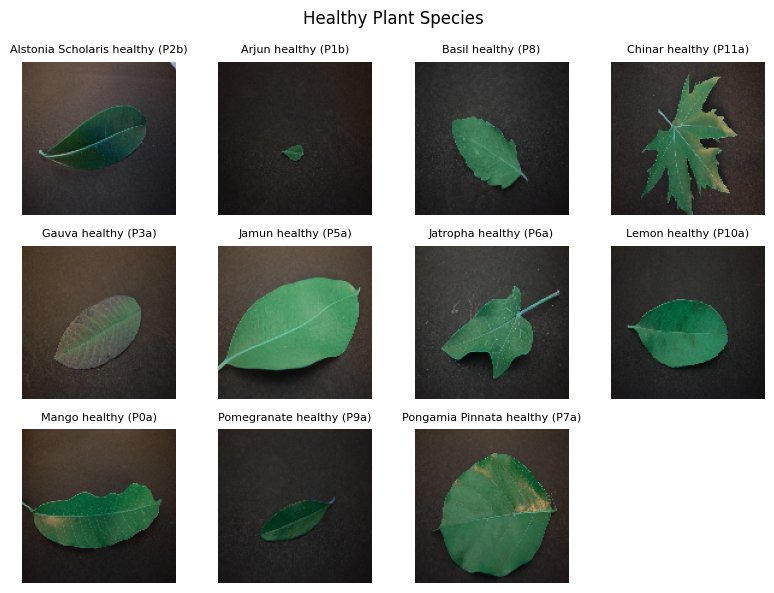

In [11]:
import matplotlib.pyplot as plt

# Define the number of rows and columns for the grid
num_rows = 3
num_cols = 4

# Define the labels for the healthy species
healthy_species_labels = ['Alstonia Scholaris healthy (P2b)', 'Arjun healthy (P1b)', 'Basil healthy (P8)', 'Chinar healthy (P11a)', 'Gauva healthy (P3a)', 'Jamun healthy (P5a)', 'Jatropha healthy (P6a)', 'Lemon healthy (P10a)', 'Mango healthy (P0a)', 'Pomegranate healthy (P9a)', 'Pongamia Pinnata healthy (P7a)']

# Calculate the actual number of images based on the available data
num_images = min(len(healthy_species_labels), num_rows * num_cols)

# Calculate the number of empty subplots
num_empty_subplots = (num_rows * num_cols) - num_images

# Define the figure size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(8, 6))

# Plot the healthy species images
for i, label in enumerate(healthy_species_labels[:num_images]):
    images = X_train[y_train_complete == label]
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(images[0])  # Plot the first image for each species
    ax.set_title(label, fontsize=8)  # Reduce the size of the labels
    ax.axis('off')

# Remove the empty subplots
for i in range(num_empty_subplots):
    fig.delaxes(axes.flatten()[num_images + i])

# Add a title to the plot
plt.suptitle('Healthy Plant Species', fontsize=12)

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()


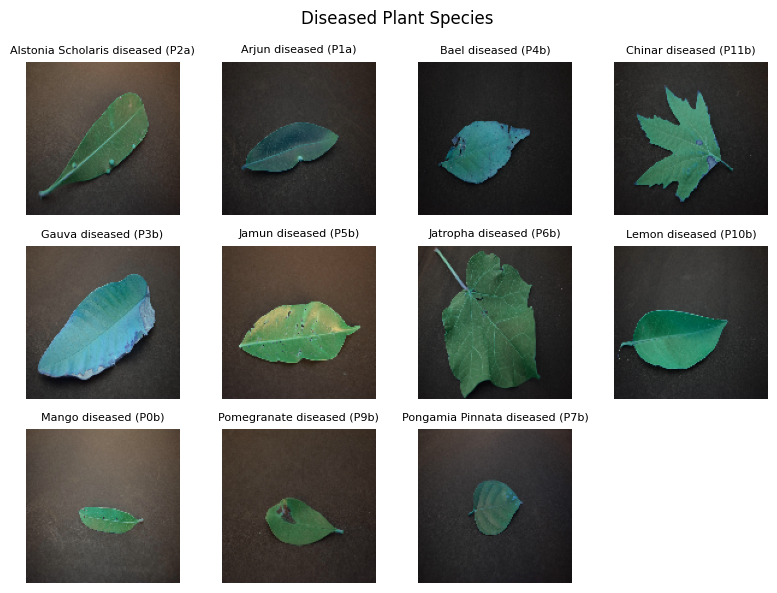

In [12]:
import matplotlib.pyplot as plt

# Define the number of rows and columns for the grid
num_rows = 3
num_cols = 4

# Define the labels for the diseased species
diseased_species_labels = ['Alstonia Scholaris diseased (P2a)', 'Arjun diseased (P1a)', 'Bael diseased (P4b)', 'Chinar diseased (P11b)', 'Gauva diseased (P3b)', 'Jamun diseased (P5b)', 'Jatropha diseased (P6b)', 'Lemon diseased (P10b)', 'Mango diseased (P0b)', 'Pomegranate diseased (P9b)', 'Pongamia Pinnata diseased (P7b)']

# Calculate the actual number of images based on the available data
num_images = min(len(diseased_species_labels), num_rows * num_cols)

# Calculate the number of empty subplots
num_empty_subplots = (num_rows * num_cols) - num_images

# Define the figure size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(8, 6))

# Plot the diseased species images
for i, label in enumerate(diseased_species_labels[:num_images]):
    images = X_train[y_train_complete == label]
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(images[0])  # Plot the first image for each species
    ax.set_title(label, fontsize=8)  # Reduce the size of the labels
    ax.axis('off')

# Remove the empty subplots
for i in range(num_empty_subplots):
    fig.delaxes(axes.flatten()[num_images + i])

# Add a title to the plot
plt.suptitle('Diseased Plant Species', fontsize=12)

# Adjust the layout and spacing
plt.tight_layout()

# Show the plot
plt.show()

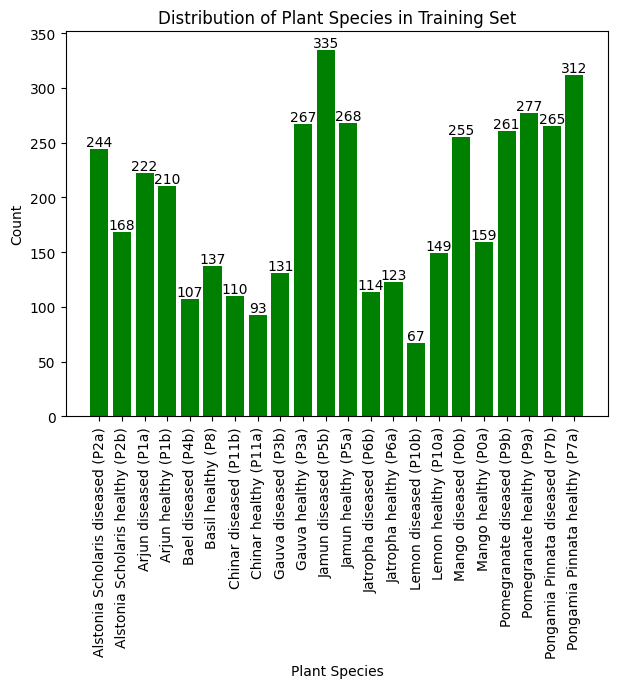

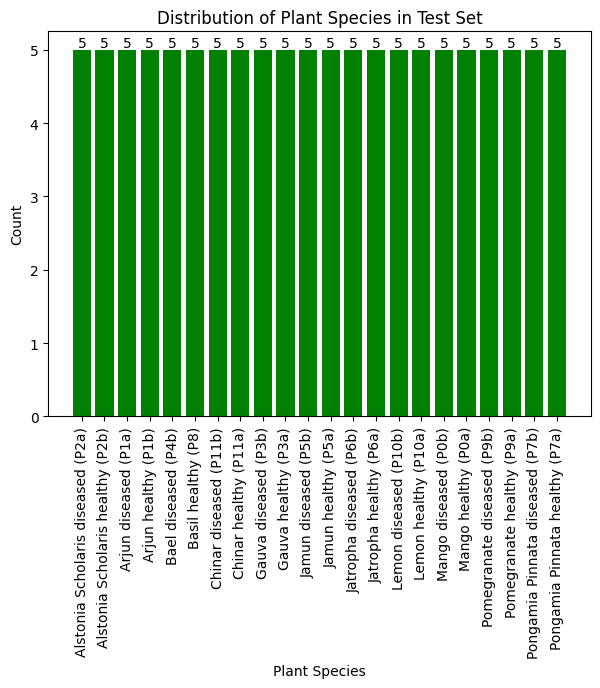

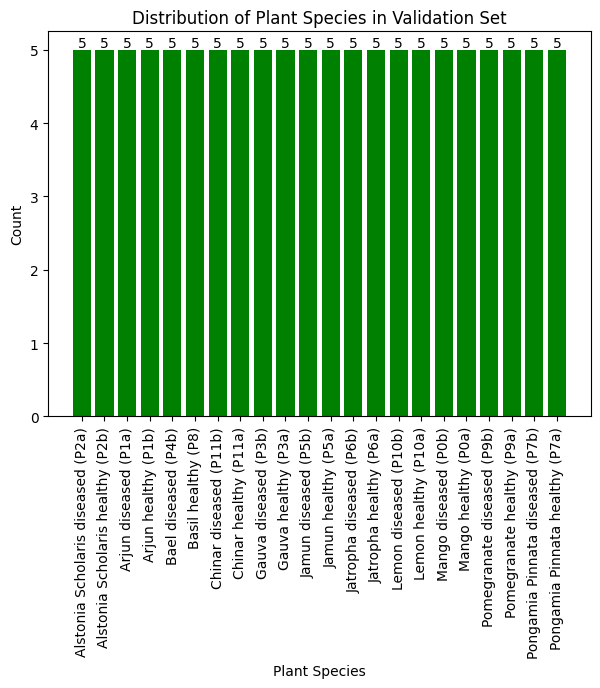

In [13]:
import matplotlib.pyplot as plt

# Function to create bar plots for distribution of plant species
def create_species_bar_plot(y_data, title):
    # Count the occurrences of each plant species
    species_counts = {}
    for label in y_data:
        if label not in species_counts:
            species_counts[label] = 0
        species_counts[label] += 1

    # Extract the plant species and their corresponding counts
    species = list(species_counts.keys())
    counts = list(species_counts.values())

    # Create a bar plot to visualize the distribution of plant species
    plt.figure(figsize=(7, 5))
    plt.bar(species, counts, color='green')

    # Add count labels above each bar
    for i, count in enumerate(counts):
        plt.text(i, count, str(count), ha='center', va='bottom')

    plt.title(title)
    plt.xlabel('Plant Species')
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.show()

# Create bar plots for y_train, y_test, and y_validation
create_species_bar_plot(y_train_complete, 'Distribution of Plant Species in Training Set')
create_species_bar_plot(y_test_complete, 'Distribution of Plant Species in Test Set')
create_species_bar_plot(y_valid_complete, 'Distribution of Plant Species in Validation Set')


# Convolutional Neural Networks models preparation

## **Hot encoding**

In [21]:
from tensorflow.keras.utils import to_categorical

# One-hot encode y_test_binary
y_train_binary_encoded = to_categorical(y_train_binary)
y_test_binary_encoded = to_categorical(y_test_binary)
y_valid_binary_encoded = to_categorical(y_valid_binary)

In [22]:
label_mapping = {'Alstonia Scholaris': 0,
              'Arjun': 1,
              'Bael': 2,
              'Basil': 3,
              'Chinar': 4,
              'Gauva': 5,
              'Jamun': 6,
              'Jatropha': 7,
              'Lemon': 8,
              'Mango': 9,
              'Pomegranate': 10,
              'Pongamia Pinnata': 11}

# Map string labels to integer values
y_train_mapped = [label_mapping[label] for label in y_train_species]
y_test_mapped = [label_mapping[label] for label in y_test_species]
y_valid_mapped = [label_mapping[label] for label in y_valid_species]

# Convert mapped labels to one-hot encoded format
y_train_species_encoded = to_categorical(y_train_mapped, 12)
y_test_species_encoded = to_categorical(y_test_mapped, 12)
y_valid_species_encoded = to_categorical(y_valid_mapped, 12)

In [23]:
label_mapping = {'Alstonia Scholaris diseased (P2a)': 0,
              'Alstonia Scholaris healthy (P2b)': 1,
              'Arjun diseased (P1a)': 2,
              'Arjun healthy (P1b)': 3,
              'Bael diseased (P4b)': 4,
              'Basil healthy (P8)': 5,
              'Chinar diseased (P11b)': 6,
              'Chinar healthy (P11a)': 7,
              'Gauva diseased (P3b)': 8,
              'Gauva healthy (P3a)': 9,
              'Jamun diseased (P5b)': 10,
              'Jamun healthy (P5a)': 11,
              'Jatropha diseased (P6b)': 12,
              'Jatropha healthy (P6a)': 13,
              'Lemon diseased (P10b)': 14,
              'Lemon healthy (P10a)': 15,
              'Mango diseased (P0b)': 16,
              'Mango healthy (P0a)': 17,
              'Pomegranate diseased (P9b)': 18,
              'Pomegranate healthy (P9a)': 19,
              'Pongamia Pinnata diseased (P7b)': 20,
              'Pongamia Pinnata healthy (P7a)': 21}

# Map string labels to integer values
y_train_mapped = [label_mapping[label] for label in y_train_complete]
y_test_mapped = [label_mapping[label] for label in y_test_complete]
y_valid_mapped = [label_mapping[label] for label in y_valid_complete]

# Convert mapped labels to one-hot encoded format
y_train_complete_encoded = to_categorical(y_train_mapped, 22)
y_test_complete_encoded = to_categorical(y_test_mapped, 22)
y_valid_complete_encoded = to_categorical(y_valid_mapped, 22)

## **CNN architecture**

### **Binary classification (Healthy - Diseased)**

In [24]:
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense, BatchNormalization

In [25]:
model_binary = Sequential([
    Conv2D(8, (3,3), input_shape=(128, 128, 3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(16, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(32, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Flatten(),
    Dense(32, activation="relu"),
    Dense(2, activation="sigmoid")
])

model_binary.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

In [26]:
model_binary2 = Sequential([
    Conv2D(8, (3,3), input_shape=(128, 128, 3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(16, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(32, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Flatten(),
    Dense(32, activation="relu"),
    Dropout(0.5),  # Add Dropout layer with a dropout rate of 0.5
    BatchNormalization(),  # Add BatchNormalization layer
    Dense(2, activation="sigmoid")
])

model_binary2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [27]:
model_binary.summary()
model_binary2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 126, 126, 8)       224       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 42, 42, 8)        0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 40, 40, 16)        1168      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 13, 13, 16)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 11, 11, 32)        4640      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 3, 3, 32)        

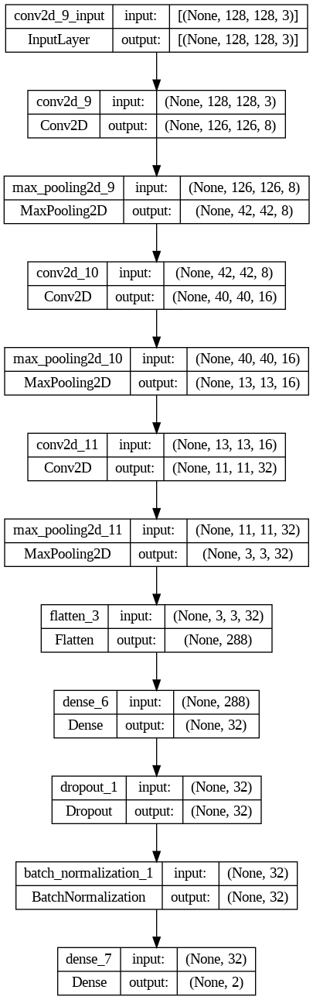

In [134]:
from tensorflow.keras.utils import plot_model
plot_model(model_binary, to_file='model_architecture.png', show_shapes=True)
plot_model(model_binary2, to_file='model_architecture.png', show_shapes=True)

### **Multiclass classification (12 plant species)**

In [28]:
model_species = Sequential([
    Conv2D(8, (3,3), input_shape=(128, 128, 3), activation="relu"),
    MaxPooling2D((3,3)),

    Conv2D(16, (3,3), activation="relu"),
    MaxPooling2D((3,3)),

    Conv2D(32, (3,3), activation="relu"),
    MaxPooling2D((3,3)),

    Flatten(),

    Dense(32, activation="relu"),
    Dense(12, activation="softmax")  # Update the number of units to 12
])

model_species.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [29]:
model_species2 = Sequential([
    Conv2D(8, (3,3), input_shape=(128, 128, 3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(16, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(32, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Flatten(),
    Dense(32, activation="relu"),
    Dropout(0.5),  # Add Dropout layer with a dropout rate of 0.5
    BatchNormalization(),  # Add BatchNormalization layer
    Dense(12, activation="softmax")  # Update the number of units to 2 and use sigmoid activation
])

model_species2.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [135]:
model_species.summary()
model_species2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 126, 126, 8)       224       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 42, 42, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 40, 40, 16)        1168      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 13, 13, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 11, 11, 32)        4640      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 3, 3, 32)        

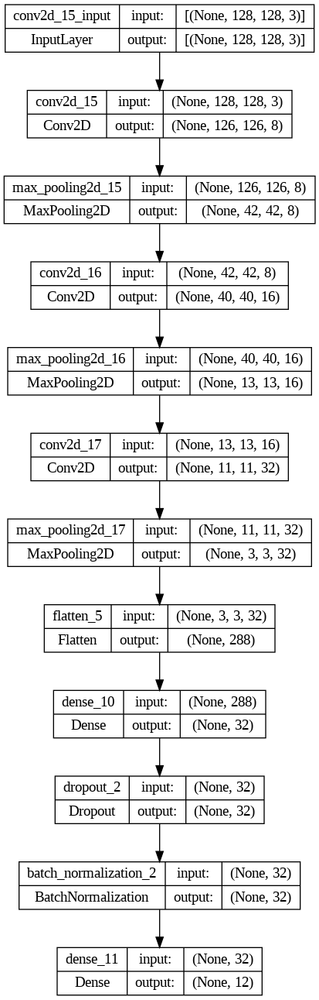

In [136]:
plot_model(model_species, to_file='model_architecture.png', show_shapes=True)
plot_model(model_species2, to_file='model_architecture.png', show_shapes=True)

### **Multiclass classification (22 complete names)**

In [30]:
model_complete = Sequential([
    Conv2D(8, (3,3), input_shape=(128, 128, 3), activation="relu"),
    MaxPooling2D((3,3)),

    Conv2D(16, (3,3), activation="relu"),
    MaxPooling2D((3,3)),

    Conv2D(32, (3,3), activation="relu"),
    MaxPooling2D((3,3)),

    Flatten(),

    Dense(32, activation="relu"),
    Dense(22, activation="softmax")  # Update the number of units to 22
])

model_complete.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [31]:
model_complete2 = Sequential([
    Conv2D(8, (3,3), input_shape=(128, 128, 3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(16, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Conv2D(32, (3,3), activation="relu"),
    MaxPooling2D((3,3)),
    Flatten(),
    Dense(32, activation="relu"),
    Dropout(0.5),  # Add Dropout layer with a dropout rate of 0.5
    BatchNormalization(),  # Add BatchNormalization layer
    Dense(22, activation="softmax")  # Update the number of units to 2 and use sigmoid activation
])

model_complete2.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [133]:
model_complete.summary()
model_complete2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 126, 126, 8)       224       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 42, 42, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 40, 40, 16)        1168      
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 13, 13, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 11, 11, 32)        4640      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 3, 3, 32)        

In [ ]:
plot_model(model_complete, to_file='model_architecture.png', show_shapes=True)
plot_model(model_complete2, to_file='model_architecture.png', show_shapes=True)

### **Training the models**
Parameters:
* optimizer = Adam
* batch size = 128
* epochs = 30

In [32]:
#Model 1 binary
history_binary = model_binary.fit(X_train, y_train_binary_encoded, batch_size=128, epochs=30, validation_data=(X_validation, y_valid_binary_encoded))

Epoch 1/30
34/34 [==============================] - 48s 1s/step - loss: 0.6877 - accuracy: 0.5339 - val_loss: 0.6668 - val_accuracy: 0.6182
Epoch 2/30
34/34 [==============================] - 33s 986ms/step - loss: 0.6183 - accuracy: 0.6650 - val_loss: 0.6037 - val_accuracy: 0.6182
Epoch 3/30
34/34 [==============================] - 33s 983ms/step - loss: 0.5753 - accuracy: 0.6940 - val_loss: 0.6048 - val_accuracy: 0.6455
Epoch 4/30
34/34 [==============================] - 34s 1s/step - loss: 0.5758 - accuracy: 0.6923 - val_loss: 0.6123 - val_accuracy: 0.5727
Epoch 5/30
34/34 [==============================] - 35s 1s/step - loss: 0.5460 - accuracy: 0.7255 - val_loss: 0.5883 - val_accuracy: 0.6273
Epoch 6/30
34/34 [==============================] - 33s 981ms/step - loss: 0.5346 - accuracy: 0.7314 - val_loss: 0.5869 - val_accuracy: 0.5818
Epoch 7/30
34/34 [==============================] - 35s 1s/step - loss: 0.5280 - accuracy: 0.7365 - val_loss: 0.5742 - val_accuracy: 0.6091
Epoch 8/30


In [33]:
#Model 2 binary
history_binary2 = model_binary2.fit(X_train, y_train_binary_encoded, batch_size=128, epochs=30, validation_data=(X_validation, y_valid_binary_encoded))

Epoch 1/30
34/34 [==============================] - 37s 1s/step - loss: 0.6817 - accuracy: 0.5849 - val_loss: 0.6880 - val_accuracy: 0.6455
Epoch 2/30
34/34 [==============================] - 33s 967ms/step - loss: 0.6116 - accuracy: 0.6820 - val_loss: 0.6803 - val_accuracy: 0.6545
Epoch 3/30
34/34 [==============================] - 34s 1s/step - loss: 0.5688 - accuracy: 0.7288 - val_loss: 0.6676 - val_accuracy: 0.6364
Epoch 4/30
34/34 [==============================] - 33s 971ms/step - loss: 0.5346 - accuracy: 0.7424 - val_loss: 0.6631 - val_accuracy: 0.6455
Epoch 5/30
34/34 [==============================] - 33s 966ms/step - loss: 0.5061 - accuracy: 0.7693 - val_loss: 0.6437 - val_accuracy: 0.6727
Epoch 6/30
34/34 [==============================] - 34s 1s/step - loss: 0.4779 - accuracy: 0.7843 - val_loss: 0.6477 - val_accuracy: 0.6818
Epoch 7/30
34/34 [==============================] - 33s 962ms/step - loss: 0.4594 - accuracy: 0.7936 - val_loss: 0.6252 - val_accuracy: 0.6273
Epoch 8/

In [37]:
#Model 3 multiclass (12 species)
history_species = model_species.fit(X_train, y_train_species_encoded, batch_size=128, epochs=30, validation_data=(X_validation, y_valid_species_encoded))

Epoch 1/30
34/34 [==============================] - 40s 1s/step - loss: 2.3818 - accuracy: 0.1568 - val_loss: 2.4525 - val_accuracy: 0.1182
Epoch 2/30
34/34 [==============================] - 36s 1s/step - loss: 2.0848 - accuracy: 0.3009 - val_loss: 2.1612 - val_accuracy: 0.2364
Epoch 3/30
34/34 [==============================] - 35s 1s/step - loss: 1.7035 - accuracy: 0.4410 - val_loss: 1.6738 - val_accuracy: 0.4364
Epoch 4/30
34/34 [==============================] - 35s 1s/step - loss: 1.4110 - accuracy: 0.5307 - val_loss: 1.5154 - val_accuracy: 0.5273
Epoch 5/30
34/34 [==============================] - 36s 1s/step - loss: 1.2725 - accuracy: 0.5732 - val_loss: 1.3919 - val_accuracy: 0.5455
Epoch 6/30
34/34 [==============================] - 34s 1s/step - loss: 1.1493 - accuracy: 0.6069 - val_loss: 1.3345 - val_accuracy: 0.5545
Epoch 7/30
34/34 [==============================] - 34s 1s/step - loss: 1.0701 - accuracy: 0.6371 - val_loss: 1.2428 - val_accuracy: 0.5818
Epoch 8/30
34/34 [==

In [38]:
#Model 4 multiclass (12 species)
history_species2 = model_species2.fit(X_train, y_train_species_encoded, batch_size=128, epochs=30, validation_data=(X_validation, y_valid_species_encoded))

Epoch 1/30
34/34 [==============================] - 35s 996ms/step - loss: 2.3755 - accuracy: 0.2103 - val_loss: 2.4593 - val_accuracy: 0.2091
Epoch 2/30
34/34 [==============================] - 33s 989ms/step - loss: 2.0300 - accuracy: 0.3397 - val_loss: 2.4117 - val_accuracy: 0.2273
Epoch 3/30
34/34 [==============================] - 36s 1s/step - loss: 1.7636 - accuracy: 0.4321 - val_loss: 2.3654 - val_accuracy: 0.2455
Epoch 4/30
34/34 [==============================] - 34s 992ms/step - loss: 1.6000 - accuracy: 0.4920 - val_loss: 2.3076 - val_accuracy: 0.2182
Epoch 5/30
34/34 [==============================] - 33s 982ms/step - loss: 1.4811 - accuracy: 0.5367 - val_loss: 2.2323 - val_accuracy: 0.3000
Epoch 6/30
34/34 [==============================] - 35s 1s/step - loss: 1.3922 - accuracy: 0.5508 - val_loss: 2.1424 - val_accuracy: 0.3364
Epoch 7/30
34/34 [==============================] - 34s 985ms/step - loss: 1.3009 - accuracy: 0.5803 - val_loss: 2.0216 - val_accuracy: 0.4273
Epoch

In [44]:
#Model 5 multiclass (22 complete names)
history_complete = model_complete.fit(X_train, y_train_complete_encoded, batch_size=128, epochs=30, validation_data=(X_validation, y_valid_complete_encoded))

Epoch 1/30
34/34 [==============================] - 38s 1s/step - loss: 3.0531 - accuracy: 0.0767 - val_loss: 3.0810 - val_accuracy: 0.0455
Epoch 2/30
34/34 [==============================] - 35s 1s/step - loss: 2.8706 - accuracy: 0.1107 - val_loss: 2.9009 - val_accuracy: 0.1000
Epoch 3/30
34/34 [==============================] - 34s 1s/step - loss: 2.4763 - accuracy: 0.2426 - val_loss: 2.6503 - val_accuracy: 0.2273
Epoch 4/30
34/34 [==============================] - 35s 1s/step - loss: 2.1296 - accuracy: 0.3484 - val_loss: 2.4877 - val_accuracy: 0.2818
Epoch 5/30
34/34 [==============================] - 36s 1s/step - loss: 1.9240 - accuracy: 0.4045 - val_loss: 2.2964 - val_accuracy: 0.2818
Epoch 6/30
34/34 [==============================] - 34s 997ms/step - loss: 1.7830 - accuracy: 0.4518 - val_loss: 2.0759 - val_accuracy: 0.4091
Epoch 7/30
34/34 [==============================] - 35s 1s/step - loss: 1.6025 - accuracy: 0.5002 - val_loss: 2.0011 - val_accuracy: 0.4545
Epoch 8/30
34/34 

In [45]:
#Model 6 multiclass (22 complete names)
history_complete2 = model_complete2.fit(X_train, y_train_complete_encoded, batch_size=128, epochs=30, validation_data=(X_validation, y_valid_complete_encoded))

Epoch 1/30
34/34 [==============================] - 36s 1s/step - loss: 3.0199 - accuracy: 0.1006 - val_loss: 3.0779 - val_accuracy: 0.1273
Epoch 2/30
34/34 [==============================] - 34s 989ms/step - loss: 2.8447 - accuracy: 0.1434 - val_loss: 3.0658 - val_accuracy: 0.1545
Epoch 3/30
34/34 [==============================] - 34s 993ms/step - loss: 2.7067 - accuracy: 0.1790 - val_loss: 3.0415 - val_accuracy: 0.1545
Epoch 4/30
34/34 [==============================] - 36s 1s/step - loss: 2.5700 - accuracy: 0.2124 - val_loss: 3.0006 - val_accuracy: 0.1273
Epoch 5/30
34/34 [==============================] - 34s 996ms/step - loss: 2.4309 - accuracy: 0.2618 - val_loss: 2.9479 - val_accuracy: 0.1364
Epoch 6/30
34/34 [==============================] - 34s 996ms/step - loss: 2.2995 - accuracy: 0.3091 - val_loss: 2.8750 - val_accuracy: 0.1727
Epoch 7/30
34/34 [==============================] - 36s 1s/step - loss: 2.1925 - accuracy: 0.3175 - val_loss: 2.7626 - val_accuracy: 0.2182
Epoch 8/

### **Plotting training and validation accuracy**

In [34]:
# Plot inspired by: https://www.kaggle.com/code/gpiosenka/plants-f1-score-98-5
import matplotlib.pyplot as plt

def plot_training(tr_data, start_epoch):
    # Plot the training and validation data
    tacc = tr_data.history['accuracy']
    tloss = tr_data.history['loss']
    vacc = tr_data.history['val_accuracy']
    vloss = tr_data.history['val_loss']
    Epoch_count = len(tacc) + start_epoch
    Epochs = []
    for i in range(start_epoch, Epoch_count):
        Epochs.append(i + 1)
    index_loss = np.argmin(vloss)  # this is the epoch with the lowest validation loss
    val_lowest = vloss[index_loss]
    index_acc = np.argmax(vacc)
    acc_highest = vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label = 'best epoch = ' + str(index_loss + 1 + start_epoch)
    vc_label = 'best epoch = ' + str(index_acc + 1 + start_epoch)
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))
    axes[0].plot(Epochs, tloss, 'r', label='Training loss')
    axes[0].plot(Epochs, vloss, 'g', label='Validation loss')
    axes[0].scatter(index_loss + 1 + start_epoch, val_lowest, s=150, c='blue', label=sc_label)
    axes[0].scatter(Epochs, tloss, s=100, c='red')
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs', fontsize=18)
    axes[0].set_ylabel('Loss', fontsize=18)
    axes[0].legend()
    axes[1].plot(Epochs, tacc, 'r', label='Training Accuracy')
    axes[1].scatter(Epochs, tacc, s=100, c='red')
    axes[1].plot(Epochs, vacc, 'g', label='Validation Accuracy')
    axes[1].scatter(index_acc + 1 + start_epoch, acc_highest, s=150, c='blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs', fontsize=18)
    axes[1].set_ylabel('Accuracy', fontsize=18)
    axes[1].legend()
    plt.tight_layout()
    plt.show()
    return index_loss

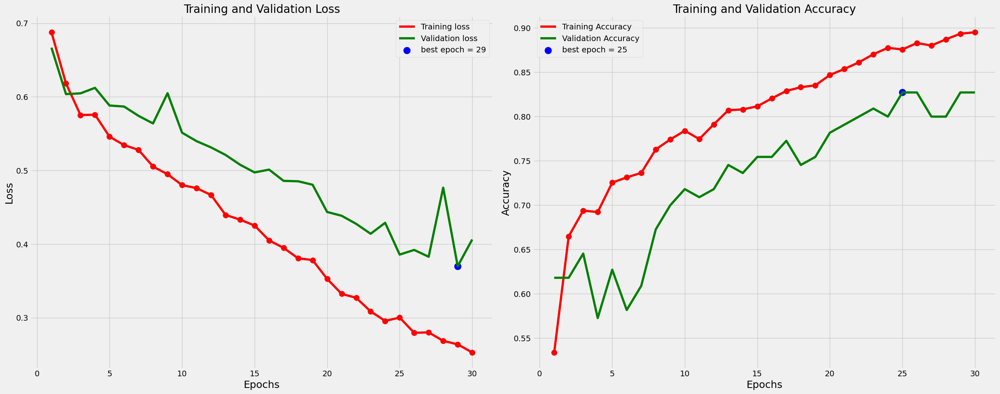

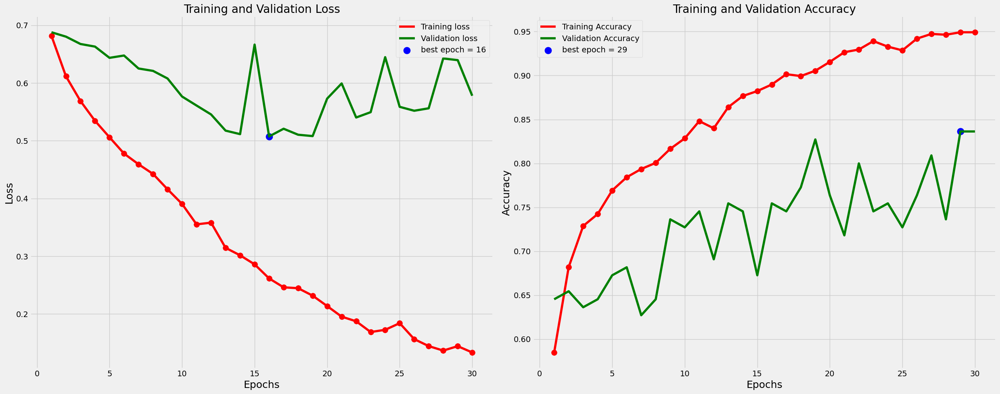

In [35]:
#Binary models
loss_index = plot_training(history_binary, 0)
loss_index = plot_training(history_binary2, 0)

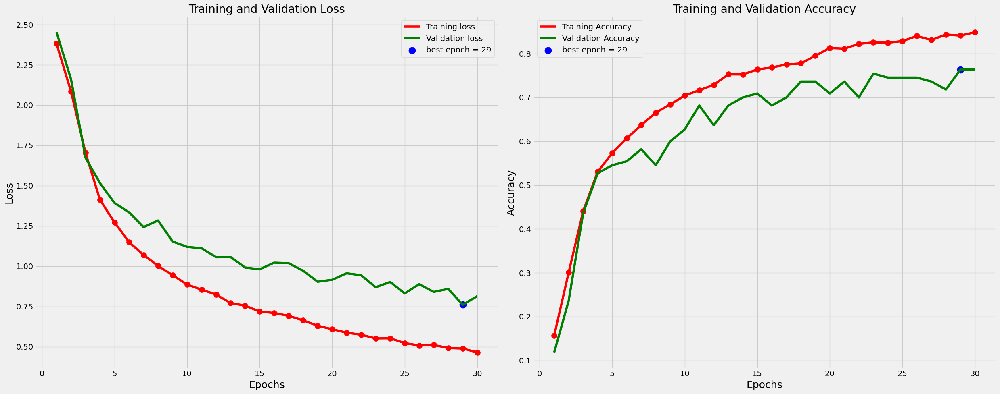

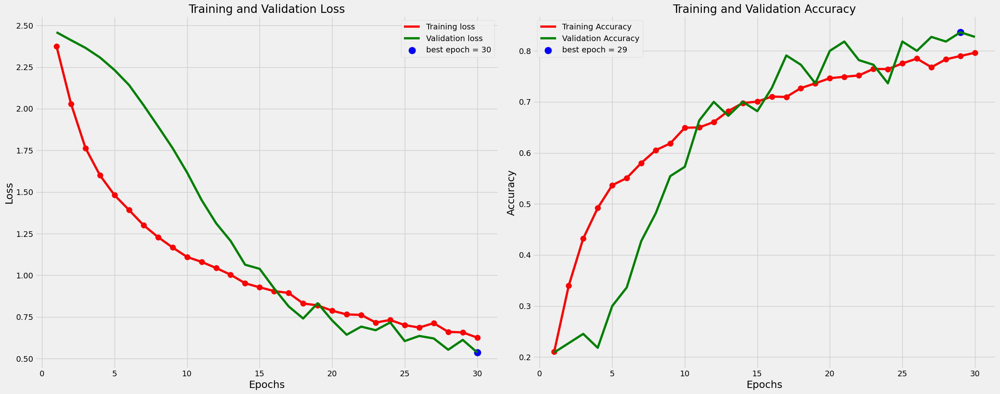

In [39]:
#Multiclass models (12 species)
loss_index = plot_training(history_species, 0)
loss_index = plot_training(history_species2, 0)

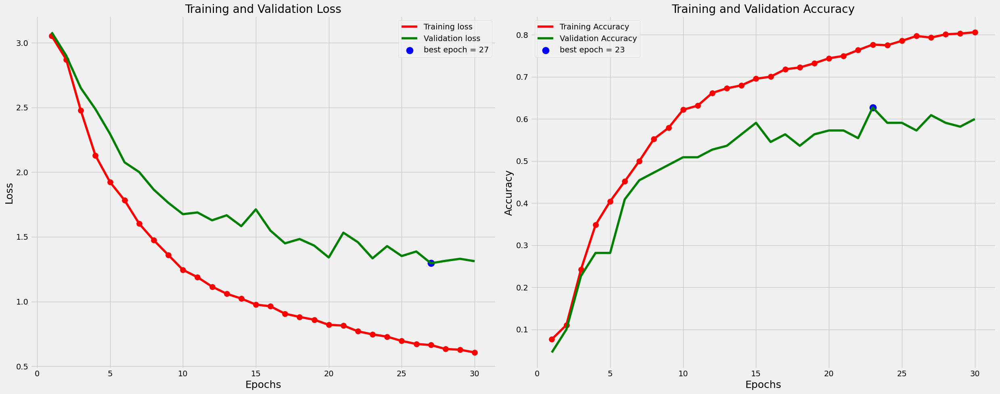

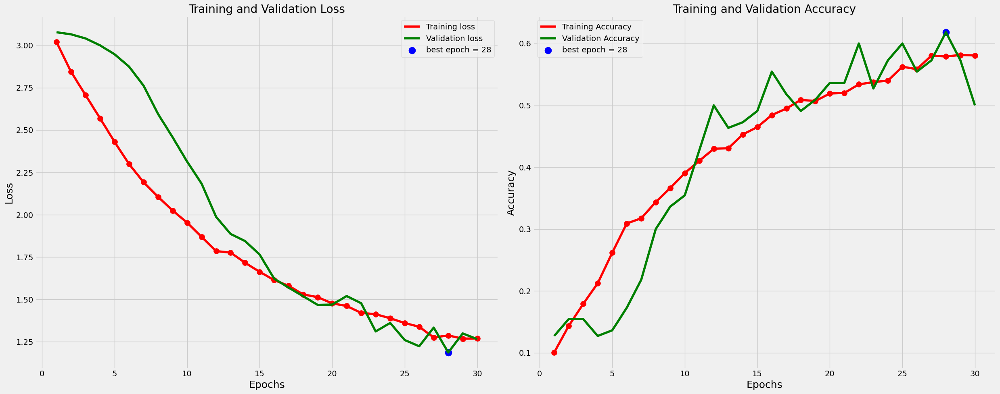

In [46]:
#Multiclass models (22 complete names)
loss_index = plot_training(history_complete, 0)
loss_index = plot_training(history_complete2, 0)

In [116]:
def print_metrics(histories, model_names):
    for history, name in zip(histories, model_names):
        acc = history.history['accuracy']
        val_acc = history.history['val_accuracy']
        loss = history.history['loss']
        val_loss = history.history['val_loss']

        print(f'----{name}----')
        print(f'Training Accuracy: {acc[-1]}')
        print(f'Training Loss: {loss[-1]}')
        print(f'Validation Accuracy: {val_acc[-1]}')
        print(f'Validation Loss: {val_loss[-1]}\n')

histories = [history_binary, history_binary2, history_species, history_species2, history_complete, history_complete2]
model_names = ['Binary Model 1', 'Binary Model 2', 'Species Model 3', 'Species Model 4', 'Complete Model 5', 'Complete Model 2']

print_metrics(histories, model_names)

----Binary Model 1----
Training Accuracy: 0.8951801657676697
Training Loss: 0.25294527411460876
Validation Accuracy: 0.8272727131843567
Validation Loss: 0.40633514523506165

----Binary Model 2----
Training Accuracy: 0.9492278695106506
Training Loss: 0.1334328055381775
Validation Accuracy: 0.8363636136054993
Validation Loss: 0.5780181288719177

----Species Model 3----
Training Accuracy: 0.8488535284996033
Training Loss: 0.4644213020801544
Validation Accuracy: 0.7636363506317139
Validation Loss: 0.8142930269241333

----Species Model 4----
Training Accuracy: 0.7962096333503723
Training Loss: 0.6261116862297058
Validation Accuracy: 0.8272727131843567
Validation Loss: 0.5370100736618042

----Complete Model 5----
Training Accuracy: 0.8060364723205566
Training Loss: 0.607102632522583
Validation Accuracy: 0.6000000238418579
Validation Loss: 1.3121029138565063

----Complete Model 2----
Training Accuracy: 0.5807206630706787
Training Loss: 1.2699252367019653
Validation Accuracy: 0.5
Validation Lo

### **Testing the Model on Test Set**

In [49]:
#Testing the binary models on the test set
test_loss, test_acc = model_binary.evaluate(X_test, y_test_binary_encoded)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

test_loss, test_acc = model_binary2.evaluate(X_test, y_test_binary_encoded)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

4/4 [==============================] - 0s 72ms/step - loss: 0.4526 - accuracy: 0.8091
Test Accuracy: 0.8090909123420715
Test Loss: 0.4526287913322449
4/4 [==============================] - 0s 116ms/step - loss: 0.4104 - accuracy: 0.8182
Test Accuracy: 0.8181818127632141
Test Loss: 0.4104381799697876


In [50]:
#Testing the multiclass models (12 species) on the test set
test_loss, test_acc = model_species.evaluate(X_test, y_test_species_encoded)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

test_loss, test_acc = model_species2.evaluate(X_test, y_test_species_encoded)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

4/4 [==============================] - 1s 123ms/step - loss: 0.5166 - accuracy: 0.8455
Test Accuracy: 0.8454545736312866
Test Loss: 0.5165650248527527
4/4 [==============================] - 1s 131ms/step - loss: 0.5556 - accuracy: 0.8000
Test Accuracy: 0.800000011920929
Test Loss: 0.5555776357650757


In [51]:
#Testing the multiclass models (22 complete names) on the test set
test_loss, test_acc = model_complete.evaluate(X_test, y_test_complete_encoded)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

test_loss, test_acc = model_complete2.evaluate(X_test, y_test_complete_encoded)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

4/4 [==============================] - 1s 133ms/step - loss: 1.1844 - accuracy: 0.6727
Test Accuracy: 0.6727272868156433
Test Loss: 1.1843796968460083
4/4 [==============================] - 1s 126ms/step - loss: 1.1076 - accuracy: 0.6818
Test Accuracy: 0.6818181872367859
Test Loss: 1.107605218887329


## **Performance metrics**
Accuracy, precision, recall, and F1 score are common evaluation metrics used in classification tasks. Here's a brief explanation of each metric:

* Accuracy: It measures the overall correctness of the classification model and is defined as the ratio of correct predictions to the total number of predictions. Accuracy alone may not be a sufficient measure when the classes are imbalanced.
* Precision: It is the ratio of true positive predictions to the total number of positive predictions. Precision measures the model's ability to correctly identify positive instances. A high precision indicates a low number of false positives.
* Recall: Also known as sensitivity or true positive rate, recall is the ratio of true positive predictions to the total number of actual positive instances. Recall measures the model's ability to identify all positive instances correctly.
* F1 Score: The F1 score is the harmonic mean of precision and recall. It provides a balance between precision and recall, considering both false positives and false negatives. The F1 score is often used when the classes are imbalanced.

These metrics are used to evaluate the performance of classification models and provide insights into their effectiveness in differentiating between classes.

In [112]:
from sklearn.metrics import classification_report
import numpy as np

def evaluate_multiclass_model(model, X_test, y_test_encoded):
    # predict classes for test set
    y_pred_probs = model.predict(X_test)

    # convert predicted probabilities to one-hot encoded labels
    y_pred = np.argmax(y_pred_probs, axis=1)

    # convert one-hot encoded test labels to integers
    y_test = np.argmax(y_test_encoded, axis=1)

    # print classification report
    report = classification_report(y_test, y_pred, target_names=[str(i) for i in range(2)])
    print(report)

# call the function
evaluate_multiclass_model(model_binary, X_test, y_test_binary_encoded)
evaluate_multiclass_model(model_binary2, X_test, y_test_binary_encoded)

4/4 [==============================] - 1s 131ms/step
              precision    recall  f1-score   support

           0       0.76      0.91      0.83        55
           1       0.89      0.71      0.79        55

    accuracy                           0.81       110
   macro avg       0.82      0.81      0.81       110
weighted avg       0.82      0.81      0.81       110

4/4 [==============================] - 1s 115ms/step
              precision    recall  f1-score   support

           0       0.76      0.93      0.84        55
           1       0.91      0.71      0.80        55

    accuracy                           0.82       110
   macro avg       0.83      0.82      0.82       110
weighted avg       0.83      0.82      0.82       110



In [72]:
from sklearn.metrics import classification_report
import numpy as np

def evaluate_multiclass_model(model, X_test, y_test_encoded):
    # predict classes for test set
    y_pred_probs = model.predict(X_test)

    # convert predicted probabilities to one-hot encoded labels
    y_pred = np.argmax(y_pred_probs, axis=1)

    # convert one-hot encoded test labels to integers
    y_test = np.argmax(y_test_encoded, axis=1)

    # print classification report
    report = classification_report(y_test, y_pred, target_names=[str(i) for i in range(12)])
    print(report)

# call the function
evaluate_multiclass_model(model_species, X_test, y_test_species_encoded)
evaluate_multiclass_model(model_species2, X_test, y_test_species_encoded)

4/4 [==============================] - 1s 129ms/step
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       0.89      0.80      0.84        10
           2       1.00      0.60      0.75         5
           3       0.62      1.00      0.77         5
           4       0.75      0.90      0.82        10
           5       0.89      0.80      0.84        10
           6       0.83      1.00      0.91        10
           7       0.88      0.70      0.78        10
           8       0.90      0.90      0.90        10
           9       0.89      0.80      0.84        10
          10       0.90      0.90      0.90        10
          11       0.73      0.80      0.76        10

    accuracy                           0.85       110
   macro avg       0.86      0.84      0.84       110
weighted avg       0.86      0.85      0.85       110

4/4 [==============================] - 0s 101ms/step
              precision    

In [71]:
from sklearn.metrics import classification_report
import numpy as np

def evaluate_multiclass_model(model, X_test, y_test_encoded):
    # predict classes for test set
    y_pred_probs = model.predict(X_test)

    # convert predicted probabilities to one-hot encoded labels
    y_pred = np.argmax(y_pred_probs, axis=1)

    # convert one-hot encoded test labels to integers
    y_test = np.argmax(y_test_encoded, axis=1)

    # print classification report
    report = classification_report(y_test, y_pred, target_names=[str(i) for i in range(22)])
    print(report)

# call the function
evaluate_multiclass_model(model_complete, X_test, y_test_complete_encoded)
evaluate_multiclass_model(model_complete2, X_test, y_test_complete_encoded)

4/4 [==============================] - 1s 213ms/step
              precision    recall  f1-score   support

           0       0.60      0.60      0.60         5
           1       0.67      0.80      0.73         5
           2       0.71      1.00      0.83         5
           3       0.71      1.00      0.83         5
           4       1.00      1.00      1.00         5
           5       0.83      1.00      0.91         5
           6       1.00      0.80      0.89         5
           7       0.71      1.00      0.83         5
           8       0.00      0.00      0.00         5
           9       0.80      0.80      0.80         5
          10       0.33      0.80      0.47         5
          11       0.17      0.20      0.18         5
          12       1.00      0.40      0.57         5
          13       0.60      0.60      0.60         5
          14       0.00      0.00      0.00         5
          15       0.56      1.00      0.71         5
          16       1.00     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


4/4 [==============================] - 1s 125ms/step
              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       1.00      0.80      0.89         5
           2       1.00      0.80      0.89         5
           3       0.62      1.00      0.77         5
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         5
           7       0.50      1.00      0.67         5
           8       1.00      0.20      0.33         5
           9       1.00      1.00      1.00         5
          10       0.31      0.80      0.44         5
          11       0.25      0.20      0.22         5
          12       0.50      0.20      0.29         5
          13       0.20      0.20      0.20         5
          14       0.00      0.00      0.00         5
          15       0.62      1.00      0.77         5
          16       0.83     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### **Confusion Matrix**
A confusion matrix is a specific table layout that allows visualization of the performance of an algorithm, typically a supervised learning one. In the context of a Convolutional Neural Network (CNN) used for classification tasks, a confusion matrix provides detailed information about the classification performance of the model.

The confusion matrix itself is a 2D matrix where each row represents the instances of an actual class and each column represents the instances of a predicted class. Here is the structure of a confusion matrix for a binary classification problem:

|                 | Predicted Positive | Predicted Negative |
|-----------------|--------------------|--------------------|
| Actual Positive | True Positive (TP) | False Negative (FN)|
| Actual Negative | False Positive (FP)| True Negative (TN) |

The labels mean:

1. True Positives (TP): The cases in which we predicted YES (they have the condition), and they do have the condition.
2. True Negatives (TN): We predicted NO, and they don't have the condition.
3. False Positives (FP): We predicted YES, but they don't actually have the condition. (Also known as a "Type I error.")
4. False Negatives (FN): We predicted NO, but they actually do have the condition. (Also known as a "Type II error.")

For multi-class classification problems, the confusion matrix would have more than two rows and columns.

Confusion matrices are extremely powerful as they not only give you insight into the errors being made by your classifier but also the types of errors that are being made. This can be a crucial step in improving your classifier as it can indicate what classes are being misclassified.

4/4 [==============================] - 0s 69ms/step


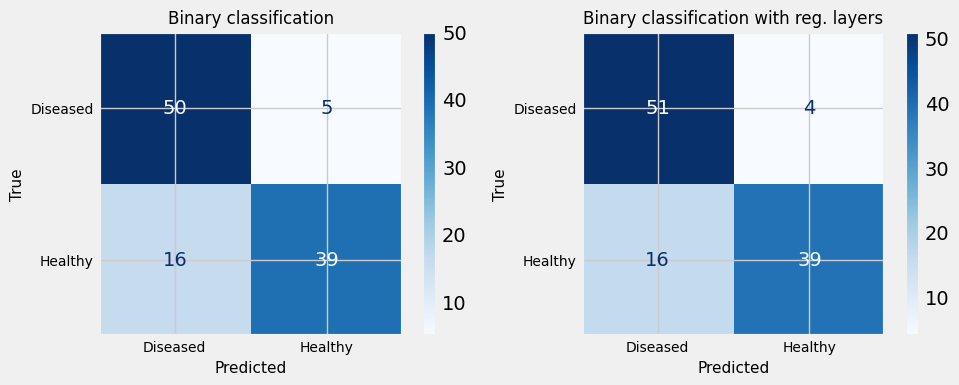

In [73]:
####CONFUSION MATRIX FOR BINARY MODELS######
############################################
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Reverse the order of labels for plotting
labels = ["Diseased", "Healthy"]

# Confusion Matrix for Model 1
y_pred = model_binary.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test_binary_encoded, axis=1)
cm_binary = confusion_matrix(y_test, y_pred)

# Confusion Matrix for Model 2
y_pred2 = model_binary2.predict(X_test)
y_pred2 = np.argmax(y_pred2, axis=1)
cm_binary2 = confusion_matrix(y_test, y_pred2)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot the confusion matrix for Model 1
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm_binary, display_labels=labels)
cm_display.plot(cmap='Blues', ax=axes[0])
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Binary classification', fontsize=12)
axes[0].tick_params(axis='both', labelsize=10)

# Plot the confusion matrix for Model 2
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm_binary2, display_labels=labels)
cm_display.plot(cmap='Blues', ax=axes[1], colorbar=True)
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Binary classification with reg. layers', fontsize=12)
axes[1].tick_params(axis='both', labelsize=10)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

4/4 [==============================] - 0s 68ms/step


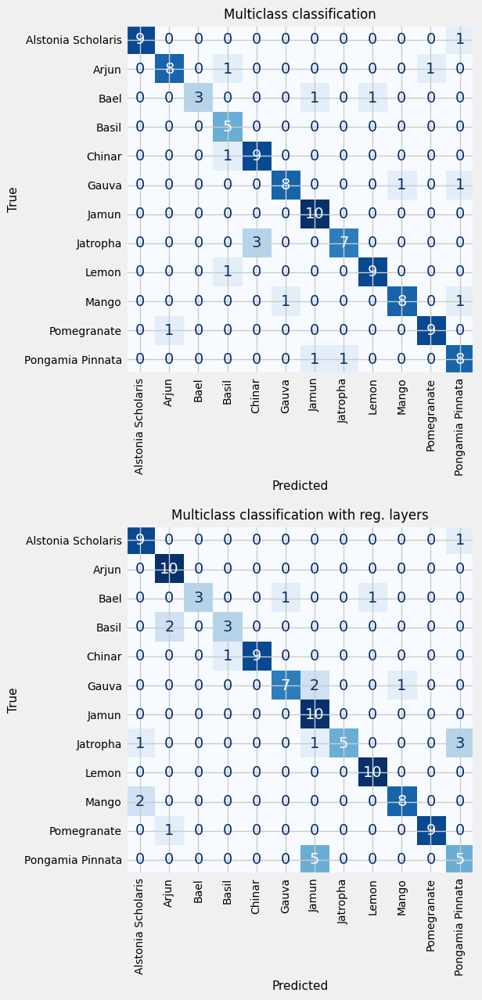

In [74]:
####CONFUSION MATRIX FOR MULTICLASS MODELS (12 SPECIES)######
#############################################################
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Reverse the order of labels for plotting
labels = ['Alstonia Scholaris', 'Arjun', 'Bael', 'Basil', 'Chinar', 'Gauva', 'Jamun', 'Jatropha', 'Lemon', 'Mango', 'Pomegranate', 'Pongamia Pinnata']

# Confusion Matrix for Model 1
y_pred = model_species.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test_species_encoded, axis=1)
cm_species = confusion_matrix(y_test, y_pred)

# Confusion Matrix for Model 2
y_pred2 = model_species2.predict(X_test)
y_pred2 = np.argmax(y_pred2, axis=1)
cm_species2 = confusion_matrix(y_test, y_pred2)

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(23, 13))

# Plot the confusion matrix for Model 1
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm_species, display_labels=labels)
cm_display.plot(cmap='Blues', ax=axes[0], colorbar=False, xticks_rotation='vertical')
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Multiclass classification', fontsize=12)
axes[0].tick_params(axis='both', labelsize=10)

# Plot the confusion matrix for Model 2
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm_species2, display_labels=labels)
cm_display.plot(cmap='Blues', ax=axes[1], colorbar=False, xticks_rotation='vertical')
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Multiclass classification with reg. layers', fontsize=12)
axes[1].tick_params(axis='both', labelsize=10)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


4/4 [==============================] - 0s 66ms/step


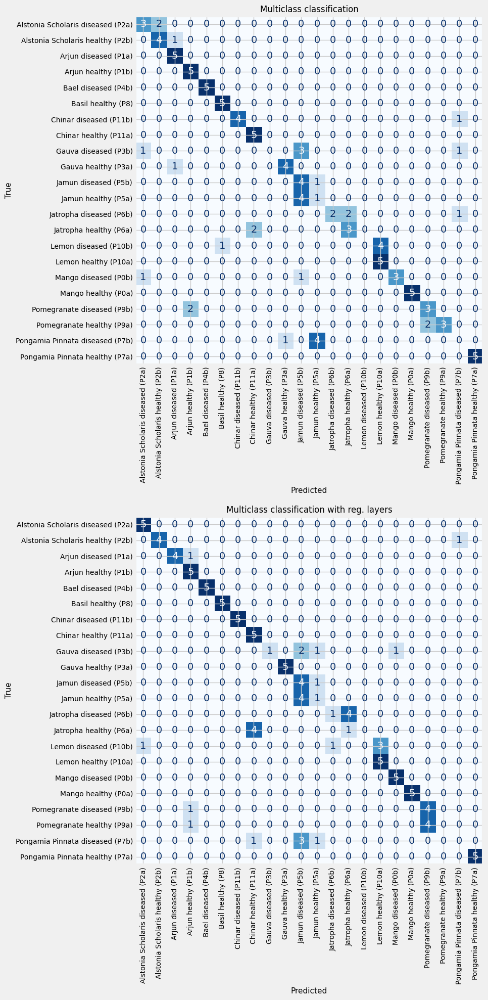

In [75]:
####CONFUSION MATRIX FOR MULTICLASS MODELS (22 NAMES)######
###########################################################
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Reverse the order of labels for plotting
labels = [
    'Alstonia Scholaris diseased (P2a)',
    'Alstonia Scholaris healthy (P2b)',
    'Arjun diseased (P1a)',
    'Arjun healthy (P1b)',
    'Bael diseased (P4b)',
    'Basil healthy (P8)',
    'Chinar diseased (P11b)',
    'Chinar healthy (P11a)',
    'Gauva diseased (P3b)',
    'Gauva healthy (P3a)',
    'Jamun diseased (P5b)',
    'Jamun healthy (P5a)',
    'Jatropha diseased (P6b)',
    'Jatropha healthy (P6a)',
    'Lemon diseased (P10b)',
    'Lemon healthy (P10a)',
    'Mango diseased (P0b)',
    'Mango healthy (P0a)',
    'Pomegranate diseased (P9b)',
    'Pomegranate healthy (P9a)',
    'Pongamia Pinnata diseased (P7b)',
    'Pongamia Pinnata healthy (P7a)'
]

# Confusion Matrix for Model 1
y_pred = model_complete.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_test = np.argmax(y_test_complete_encoded, axis=1)
cm_complete = confusion_matrix(y_test, y_pred)

# Confusion Matrix for Model 2
y_pred2 = model_complete2.predict(X_test)
y_pred2 = np.argmax(y_pred2, axis=1)
cm_complete2 = confusion_matrix(y_test, y_pred2)

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(30, 20))

# Plot the confusion matrix for Model 1
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm_complete, display_labels=labels)
cm_display.plot(cmap='Blues', ax=axes[0], colorbar=False, xticks_rotation='vertical')
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Multiclass classification', fontsize=12)
axes[0].tick_params(axis='both', labelsize=10)

# Plot the confusion matrix for Model 2
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm_complete2, display_labels=labels)
cm_display.plot(cmap='Blues', ax=axes[1], colorbar=False, xticks_rotation='vertical')
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Multiclass classification with reg. layers', fontsize=12)
axes[1].tick_params(axis='both', labelsize=10)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


### **Wrong predictions**

4/4 [==============================] - 1s 175ms/step


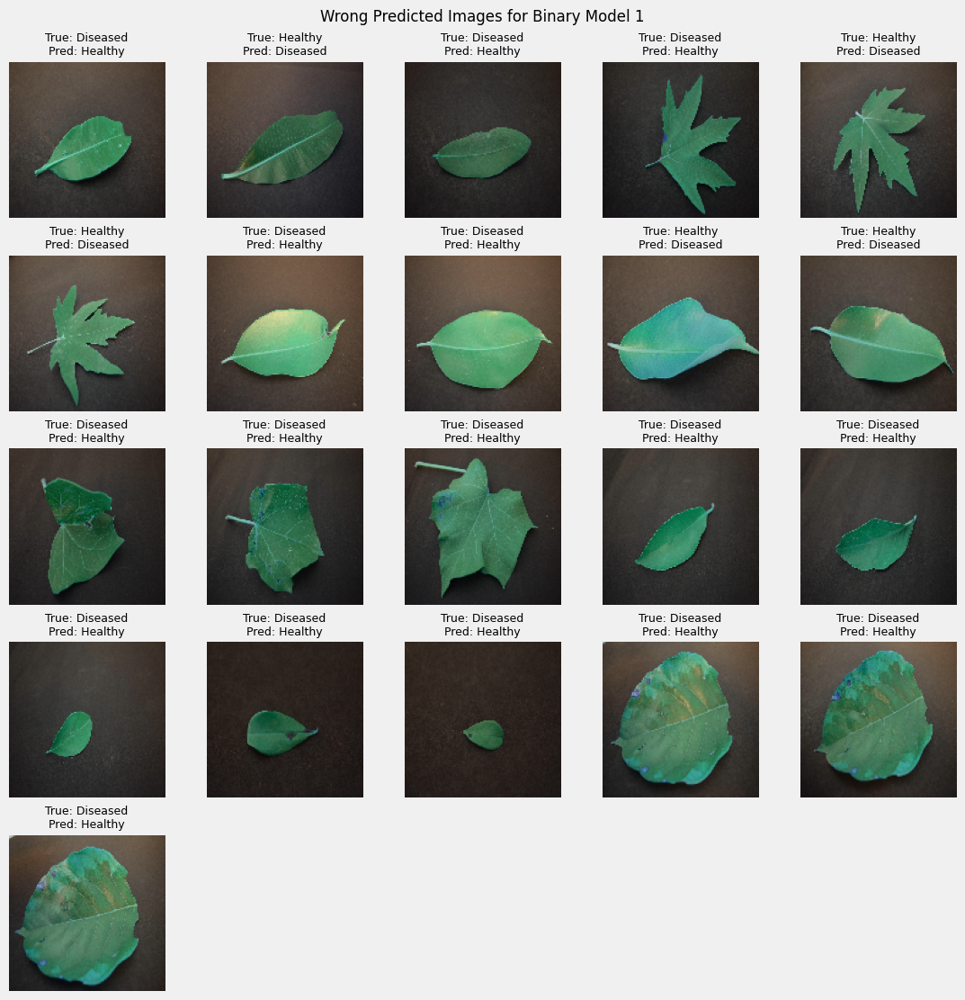

In [131]:
######WRONG PREDICTIONS FOR BINARY MODEL 1#######
#################################################

# Set the number of rows and columns for the plot
num_rows = 5
num_cols = 4

# Make predictions using the specific model
y_pred = model_binary.predict(X_test)

# Get the predicted labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Get the indices of the wrong predictions for the specific model
wrong_prediction_indices = np.where(y_test_binary != y_pred_labels)[0]

# Set the number of rows and columns for the plot
num_images = len(wrong_prediction_indices)
num_cols = min(5, num_images)
num_rows = (num_images + num_cols - 1) // num_cols

# Create the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(11, 11), constrained_layout=True)

# Define the labels
labels = {0: "Healthy", 1: "Diseased"}

# Iterate over the wrong predictions and plot the images
for i, idx in enumerate(wrong_prediction_indices):
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(X_test[idx])  # Assuming X_test contains the images
    ax.set_title(f"True: {labels[y_test_binary[idx]]}\nPred: {labels[y_pred_labels[idx]]}", fontsize=9)
    ax.axis('off')


# Remove empty grids
if num_images < num_rows * num_cols:
    for i in range(num_images, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

# Adjust the title placement
fig.suptitle("Wrong Predicted Images for Binary Model 1", fontsize=12)

# Show the plot
plt.show()


4/4 [==============================] - 1s 118ms/step


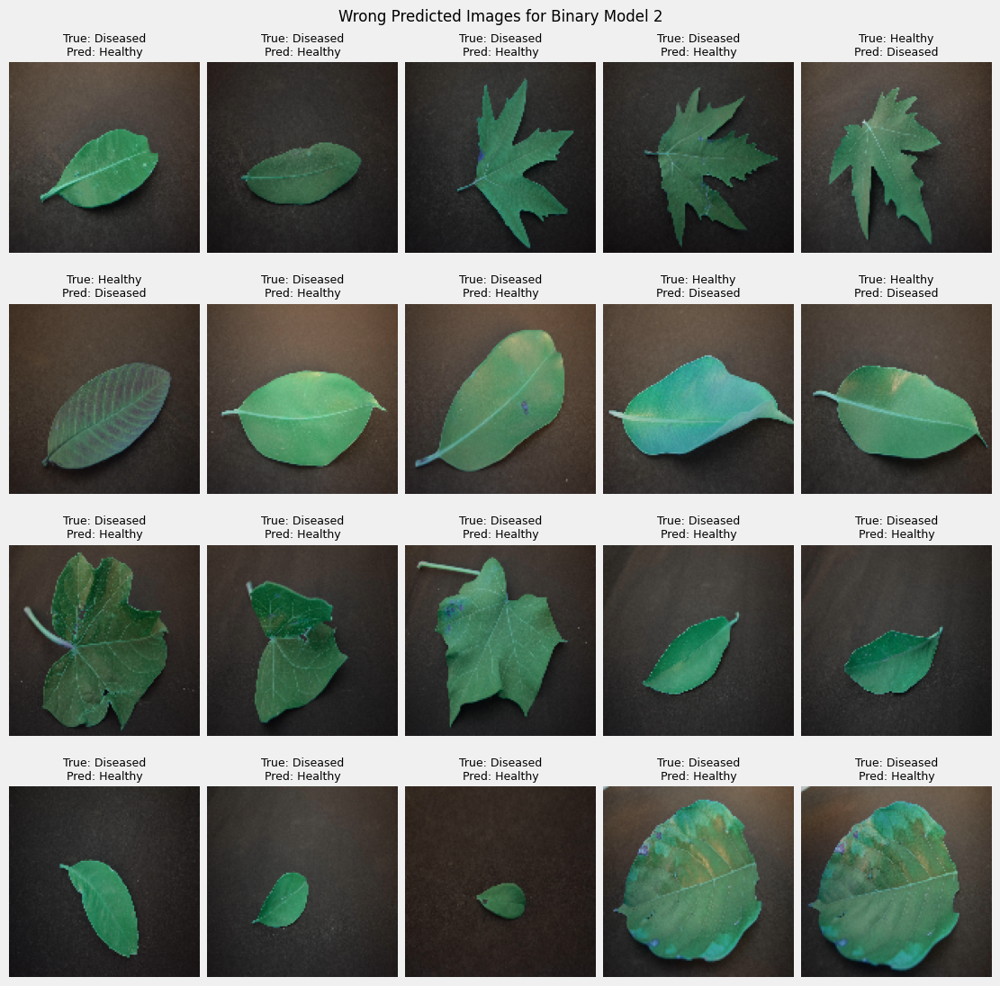

In [132]:
######WRONG PREDICTIONS FOR BINARY MODEL 2#######
#################################################

# Set the number of rows and columns for the plot
num_rows = 5
num_cols = 4

# Make predictions using the specific model
y_pred = model_binary2.predict(X_test)

# Get the predicted labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Get the indices of the wrong predictions for the specific model
wrong_prediction_indices = np.where(y_test_binary != y_pred_labels)[0]

# Set the number of rows and columns for the plot
num_images = len(wrong_prediction_indices)
num_cols = min(5, num_images)
num_rows = (num_images + num_cols - 1) // num_cols

# Create the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(11, 11), constrained_layout=True)

# Define the labels
labels = {0: "Healthy", 1: "Diseased"}

# Iterate over the wrong predictions and plot the images
for i, idx in enumerate(wrong_prediction_indices):
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(X_test[idx])  # Assuming X_test contains the images
    ax.set_title(f"True: {labels[y_test_binary[idx]]}\nPred: {labels[y_pred_labels[idx]]}", fontsize=9)
    ax.axis('off')


# Remove empty grids
if num_images < num_rows * num_cols:
    for i in range(num_images, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

# Adjust the title placement
fig.suptitle("Wrong Predicted Images for Binary Model 2", fontsize=12)

# Show the plot
plt.show()


4/4 [==============================] - 0s 70ms/step


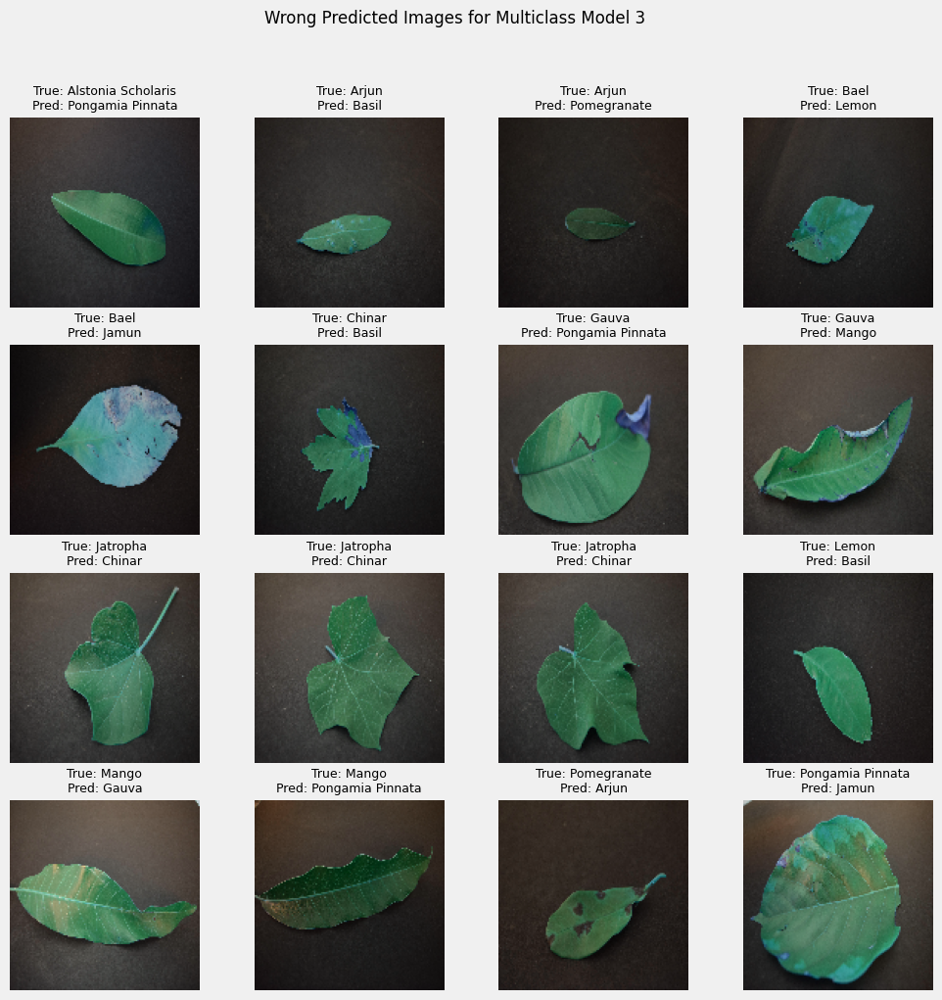

In [123]:
######WRONG PREDICTIONS FOR MULTICL MODEL 3#######
#################################################
# Create a label encoder object
label_encoder = LabelEncoder()

# Fit the label encoder on the species labels
label_encoder.fit(y_test_species)

# Transform the species labels to integer labels
y_test_species_encoded = label_encoder.transform(y_test_species)

# Set the number of rows and columns for the plot
num_rows = 4
num_cols = 4

# Make predictions using the specific model
y_pred_species = model_species.predict(X_test)  # Replace 'model_species' with your desired model

# Get the predicted labels
y_pred_labels = np.argmax(y_pred_species, axis=1)

# Get the indices of the wrong predictions for the specific model
wrong_prediction_indices = np.where(y_test_species_encoded != y_pred_labels)[0]

# Create the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(11, 11))

# Iterate over the wrong predictions and plot the images
for i, idx in enumerate(wrong_prediction_indices[:num_rows * num_cols]):
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(X_test[idx])  # Assuming X_test contains the images

    # Decode the true and predicted labels
    true_label = label_encoder.inverse_transform([y_test_species_encoded[idx]])[0]
    pred_label = label_encoder.inverse_transform([y_pred_labels[idx]])[0]

    ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=9)
    ax.axis('off')


# Remove empty grids
if num_images < num_rows * num_cols:
    for i in range(num_images, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

# Adjust the title placement
fig.suptitle("Wrong Predicted Images for Multiclass Model 3", fontsize=12)

# Show the plot
plt.show()


4/4 [==============================] - 1s 173ms/step


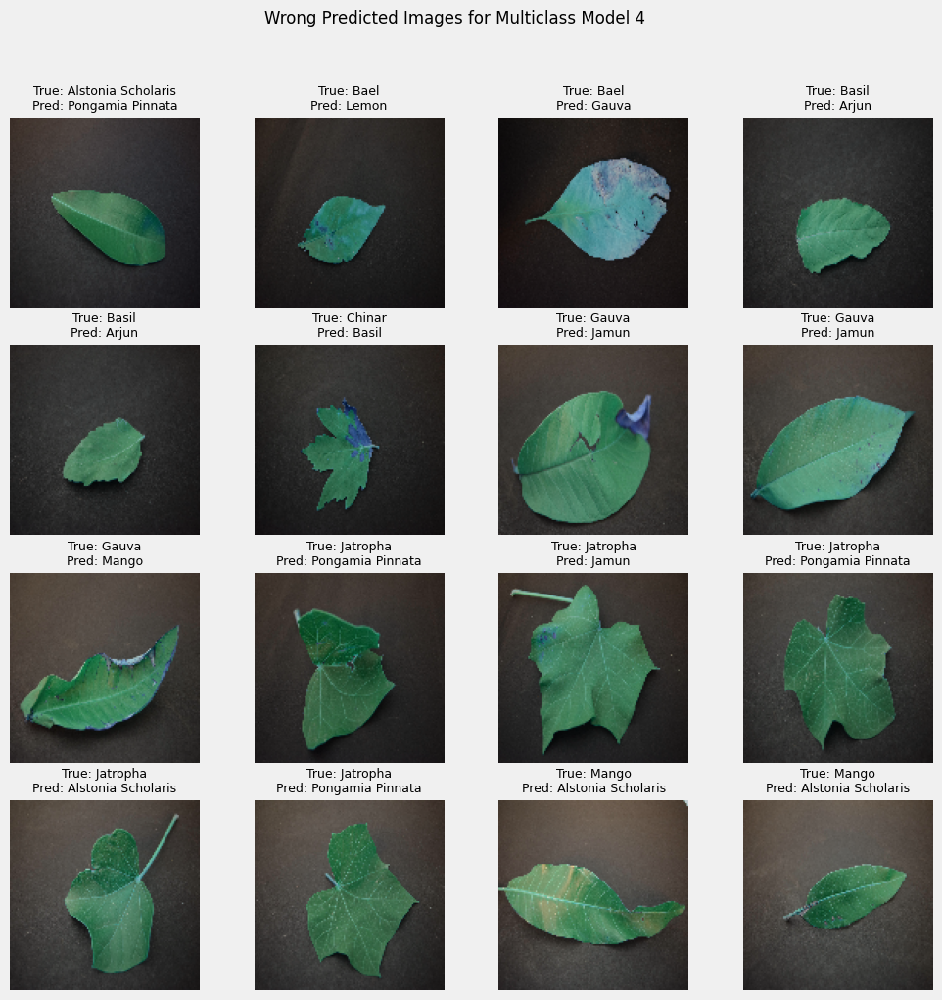

In [124]:
######WRONG PREDICTIONS FOR MULTIC MODEL 4#######
#################################################
# Create a label encoder object
label_encoder = LabelEncoder()

# Fit the label encoder on the species labels
label_encoder.fit(y_test_species)

# Transform the species labels to integer labels
y_test_species_encoded = label_encoder.transform(y_test_species)

# Set the number of rows and columns for the plot
num_rows = 4
num_cols = 4

# Make predictions using the specific model
y_pred_species = model_species2.predict(X_test)  # Replace 'model_species' with your desired model

# Get the predicted labels
y_pred_labels = np.argmax(y_pred_species, axis=1)

# Get the indices of the wrong predictions for the specific model
wrong_prediction_indices = np.where(y_test_species_encoded != y_pred_labels)[0]

# Create the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(11, 11))

# Iterate over the wrong predictions and plot the images
for i, idx in enumerate(wrong_prediction_indices[:num_rows * num_cols]):
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(X_test[idx])  # Assuming X_test contains the images

    # Decode the true and predicted labels
    true_label = label_encoder.inverse_transform([y_test_species_encoded[idx]])[0]
    pred_label = label_encoder.inverse_transform([y_pred_labels[idx]])[0]

    ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=9)
    ax.axis('off')


# Remove empty grids
if num_images < num_rows * num_cols:
    for i in range(num_images, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

# Adjust the title placement
fig.suptitle("Wrong Predicted Images for Multiclass Model 4", fontsize=12)

# Show the plot
plt.show()

4/4 [==============================] - 0s 97ms/step


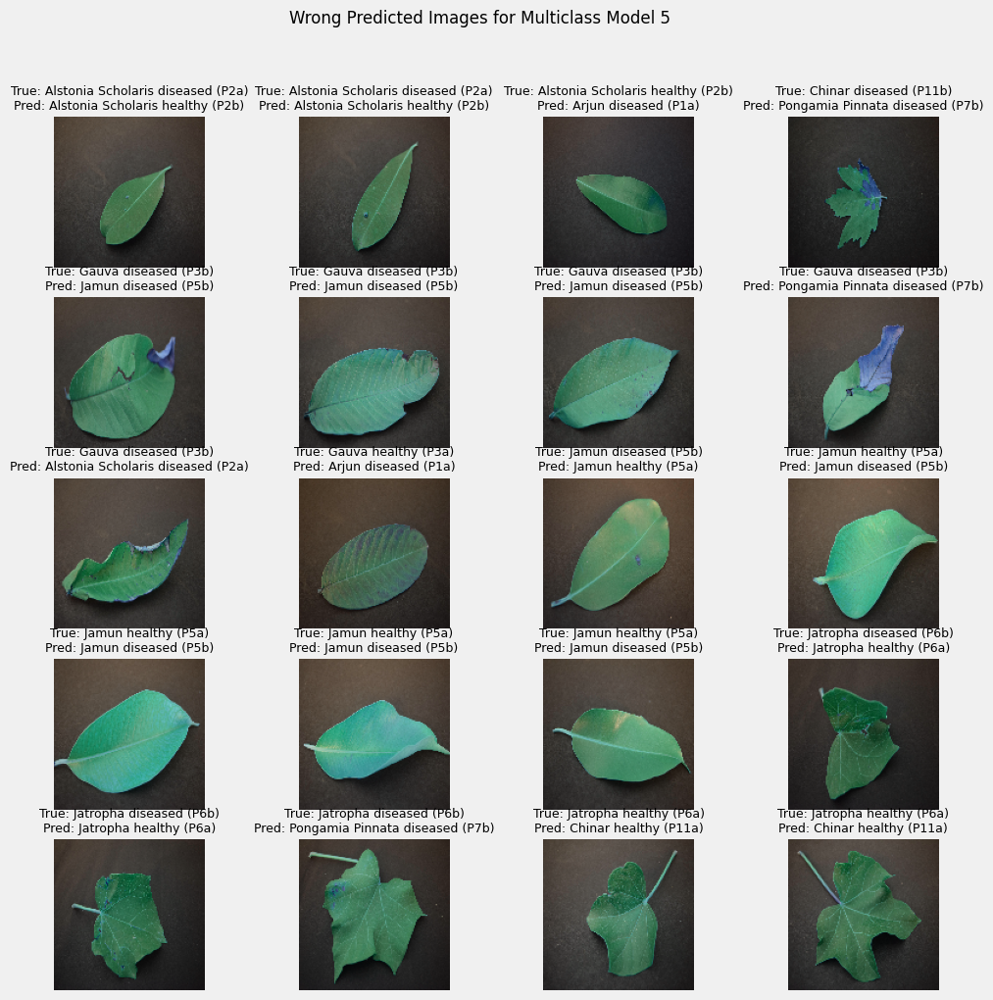

In [128]:
######WRONG PREDICTIONS FOR MULTIC MODEL 5#######
#################################################
# Create a label encoder object
label_encoder = LabelEncoder()

# Fit the label encoder on the complete labels
label_encoder.fit(y_test_complete)

# Transform the species labels to integer labels
y_test_complete_encoded = label_encoder.transform(y_test_complete)

# Set the number of rows and columns for the plot
num_rows = 5
num_cols = 4

# Make predictions using the specific model
y_pred_complete = model_complete.predict(X_test)  # Replace 'model_species' with your desired model

# Get the predicted labels
y_pred_labels = np.argmax(y_pred_complete, axis=1)

# Get the indices of the wrong predictions for the specific model
wrong_prediction_indices = np.where(y_test_complete_encoded != y_pred_labels)[0]

# Create the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(11, 11))

# Iterate over the wrong predictions and plot the images
for i, idx in enumerate(wrong_prediction_indices[:num_rows * num_cols]):
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(X_test[idx])  # Assuming X_test contains the images

    # Decode the true and predicted labels
    true_label = label_encoder.inverse_transform([y_test_complete_encoded[idx]])[0]
    pred_label = label_encoder.inverse_transform([y_pred_labels[idx]])[0]

    ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=9)
    ax.axis('off')


# Remove empty grids
if num_images < num_rows * num_cols:
    for i in range(num_images, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

# Adjust the title placement
fig.suptitle("Wrong Predicted Images for Multiclass Model 5", fontsize=12)

# Show the plot
plt.show()

4/4 [==============================] - 1s 166ms/step


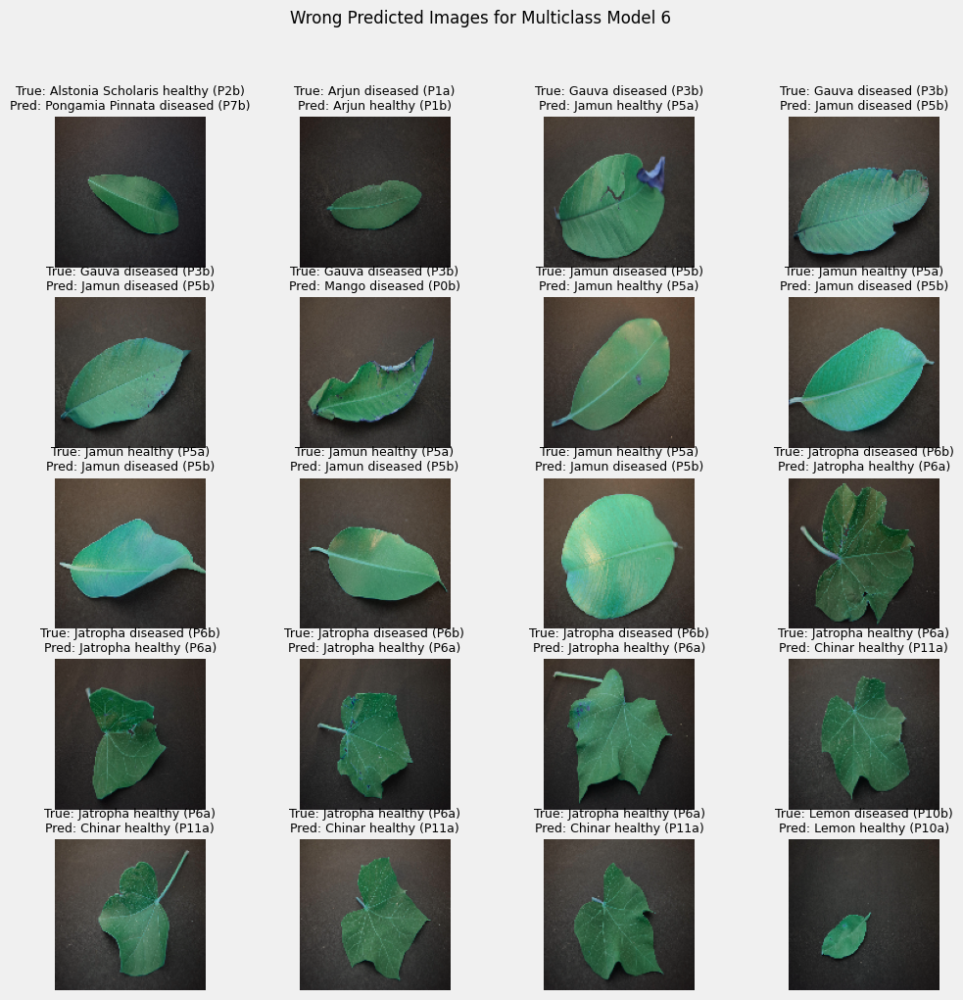

In [127]:
######WRONG PREDICTIONS FOR MULTIC MODEL 6#######
#################################################
# Create a label encoder object
label_encoder = LabelEncoder()

# Fit the label encoder on the complete labels
label_encoder.fit(y_test_complete)

# Transform the species labels to integer labels
y_test_complete_encoded = label_encoder.transform(y_test_complete)

# Set the number of rows and columns for the plot
num_rows = 5
num_cols = 4

# Make predictions using the specific model
y_pred_complete = model_complete2.predict(X_test)  # Replace 'model_species' with your desired model

# Get the predicted labels
y_pred_labels = np.argmax(y_pred_complete, axis=1)

# Get the indices of the wrong predictions for the specific model
wrong_prediction_indices = np.where(y_test_complete_encoded != y_pred_labels)[0]

# Create the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(11, 11))

# Iterate over the wrong predictions and plot the images
for i, idx in enumerate(wrong_prediction_indices[:num_rows * num_cols]):
    ax = axes[i // num_cols, i % num_cols]
    ax.imshow(X_test[idx])  # Assuming X_test contains the images

    # Decode the true and predicted labels
    true_label = label_encoder.inverse_transform([y_test_complete_encoded[idx]])[0]
    pred_label = label_encoder.inverse_transform([y_pred_labels[idx]])[0]

    ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=9)
    ax.axis('off')


# Remove empty grids
if num_images < num_rows * num_cols:
    for i in range(num_images, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

# Adjust the title placement
fig.suptitle("Wrong Predicted Images for Multiclass Model 6", fontsize=12)

# Show the plot
plt.show()